In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso

from sklearn.preprocessing import StandardScaler

class_name = 'Occupancy'
df_training = pd.read_csv('training.csv', skipinitialspace=True, na_values='?', 
                 keep_default_na=True)

df_test = pd.read_csv('test.csv', skipinitialspace=True, na_values='?', 
                 keep_default_na=True)

columns2remove = ['date', 'Unnamed: 0', 'cumulative_hour', 'cumulative_minute', 'day', 'hour', 'minute', 'day_minute', 'weekend', 'Occupancy']
df_training.drop(columns2remove, inplace=True, axis=1)
df_test.drop(columns2remove, inplace=True, axis=1)

df_training.head()

,Temperature,Humidity,Light,CO2,HumidityRatio
0,23.7000,26.272,585.200000,749.200000,0.004764
1,23.7180,26.290,578.400000,760.400000,0.004773
2,23.7300,26.230,572.666667,769.666667,0.004765
3,23.7225,26.125,493.750000,774.750000,0.004744
4,23.7540,26.200,488.600000,779.000000,0.004767


In [2]:
df_training.corr()

,Temperature,Humidity,Light,CO2,HumidityRatio
Temperature,1.000000,-0.061995,0.683880,0.547312,0.325931
Humidity,-0.061995,1.000000,0.062304,0.392674,0.921657
Light,0.683880,0.062304,1.000000,0.614716,0.325926
CO2,0.547312,0.392674,0.614716,1.000000,0.601565
HumidityRatio,0.325931,0.921657,0.325926,0.601565,1.000000


--------------------

Normalizziamo il dataset

In [3]:
scaler = StandardScaler()
df_tr_norm=pd.DataFrame(scaler.fit_transform(df_training.values), columns = df_training.columns)
df_te_norm=pd.DataFrame(scaler.fit_transform(df_test.values), columns = df_test.columns)

df_te_norm

,Temperature,Humidity,Light,CO2,HumidityRatio
0,-1.203686,1.413658,-0.565326,-1.010338,0.894662
1,-1.203686,1.413658,-0.565326,-0.999815,0.894662
2,-1.203686,1.413658,-0.565326,-1.011842,0.894662
3,-1.203686,1.413658,-0.565326,-1.017855,0.894662
4,-1.243293,1.435008,-0.565326,-1.009837,0.896334
...,...,...,...,...,...
6163,0.149578,-1.082045,1.933390,2.001682,-1.083659
6164,0.215591,-1.074039,1.897050,2.029495,-1.048478
6165,0.248597,-1.074039,1.897050,2.050542,-1.035140
6166,0.248597,-0.993251,1.869432,2.382789,-0.948340


------- x = Humidity , y = Temperature ---------
R2: 0.038
MSE: 0.962
MAE: 0.799


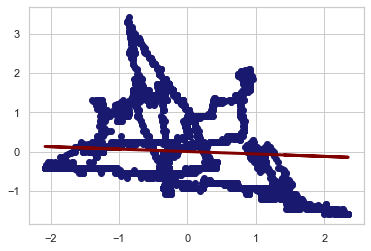

------- x = Light , y = Temperature ---------
R2: 0.482
MSE: 0.518
MAE: 0.543


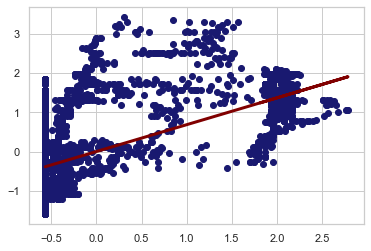

------- x = CO2 , y = Temperature ---------
R2: 0.257
MSE: 0.743
MAE: 0.674


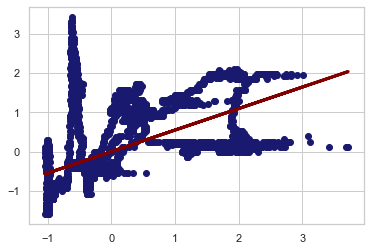

------- x = HumidityRatio , y = Temperature ---------
R2: -0.030
MSE: 1.030
MAE: 0.835


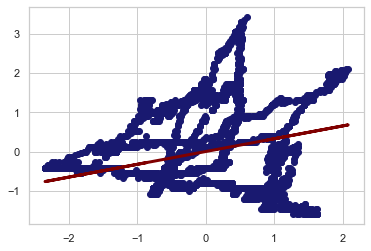

------- x = Light , y = Humidity ---------
R2: -0.019
MSE: 1.019
MAE: 0.846


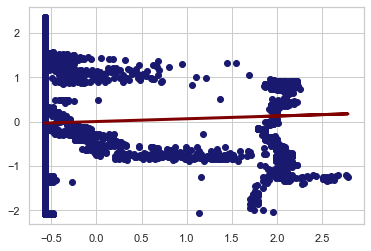

------- x = CO2 , y = Humidity ---------
R2: -0.457
MSE: 1.457
MAE: 0.948


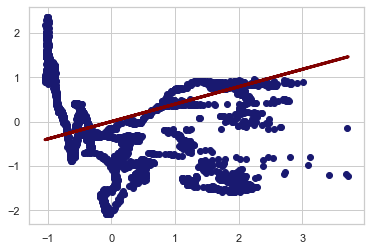

------- x = HumidityRatio , y = Humidity ---------
R2: 0.802
MSE: 0.198
MAE: 0.357


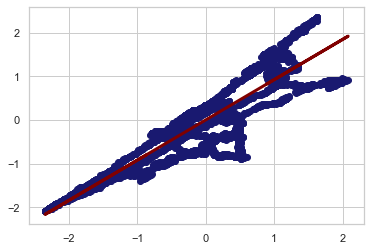

------- x = CO2 , y = Light ---------
R2: -0.037
MSE: 1.037
MAE: 0.741


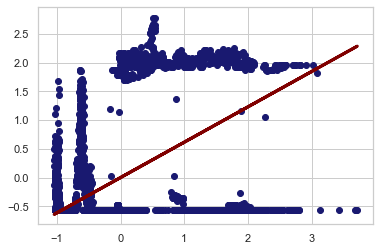

------- x = HumidityRatio , y = Light ---------
R2: 0.019
MSE: 0.981
MAE: 0.770


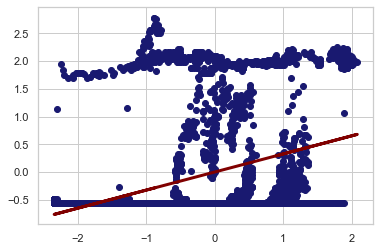

------- x = HumidityRatio , y = CO2 ---------
R2: -0.549
MSE: 1.549
MAE: 0.985


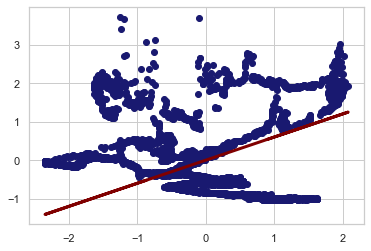

In [4]:
# analizziamo la regressione con tutte le coppie di attributi
reg = LinearRegression()
col = df_training.columns

i = 0
for y in col:
    j = 0
    for x in col:
        if(j > i): # avoid to overlap regressions (ex. x=Light, y=CO2 and x=CO2, y=Light)
            print('------- x =', x, ', y =', y, '---------')
            reg.fit(df_tr_norm[x].values.reshape(-1, 1), df_tr_norm[y])
            y_pred = reg.predict(df_te_norm[x].values.reshape(-1, 1))

            print('R2: %.3f' % r2_score(df_te_norm[y], y_pred))
            print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
            print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))
            sns.set(style='whitegrid')
            plt.scatter(df_te_norm[x], df_te_norm[y],  color='midnightblue')
            plt.plot(df_te_norm[x], y_pred, color='maroon', linewidth=3)
            plt.show()
            
        j += 1
    i += 1

--------------------------
# Simple Regression

Selezioniamo HumidityRatio e Humidity per Simple Regression

-------x = Humidity , y =  HumidityRatio ---------
R2: 0.802
MSE: 0.198
MAE: 0.365


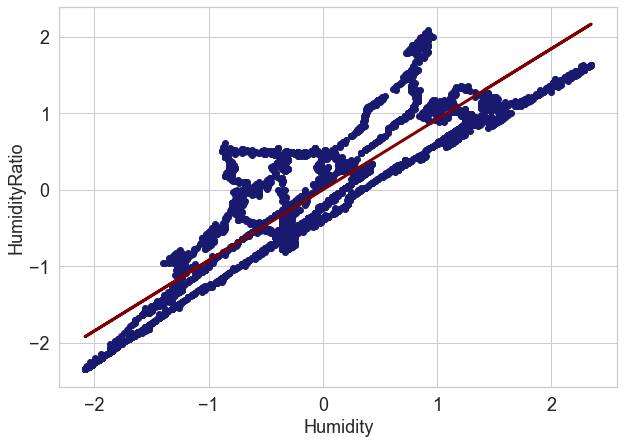

In [5]:
x = 'Humidity'
y = 'HumidityRatio'
print('-------x =', x, ', y = ', y, '---------')
reg.fit(df_tr_norm[x].values.reshape(-1, 1), df_tr_norm[y])
y_pred = reg.predict(df_te_norm[x].values.reshape(-1, 1))
print('R2: %.3f' % r2_score(df_te_norm[y], y_pred))
print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))
plt.figure(figsize=(10, 7))
plt.scatter(df_te_norm[x], df_te_norm[y],  color='midnightblue')
plt.plot(df_te_norm[x], y_pred, color='maroon', linewidth=3)
plt.xlabel(x, fontsize=18)
plt.ylabel(y, fontsize=18)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.show()

---------------------------------

# Multiple Regression

In [6]:
Xs = [col for col in df_tr_norm.columns if col != y]

reg.fit(df_tr_norm[Xs], df_tr_norm[y])
y_pred = reg.predict(df_te_norm[Xs])
reg.fit(df_tr_norm[Xs], df_tr_norm[y])

print('Coefficients: \n', reg.coef_)
print('Intercept: \n', reg.intercept_)

print('\nR2: %.3f' % r2_score(df_te_norm[y], y_pred))
print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))

Coefficients: 
 [ 0.36622997  0.92866118 -0.00772177  0.04120792]
Intercept: 
 -4.962265029478138e-16

R2: 0.980
MSE: 0.020
MAE: 0.111


### Lasso Regression

First with a Simple Regression model

    x = Humidity
    y = HumidityRatio

Coefficients: 
 [0.72165711]
Intercept: 
 -6.420484879670774e-16

R2: 0.772
MSE: 0.228
MAE: 0.369


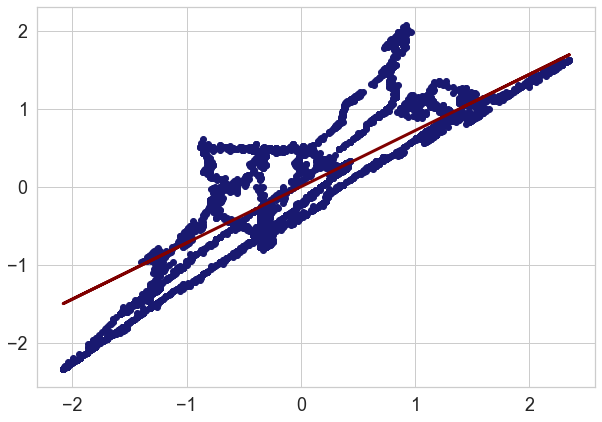

In [7]:
reg = Lasso(alpha = 0.2)
reg.fit(df_tr_norm[x].values.reshape(-1,1), df_tr_norm[y])
print('Coefficients: \n', reg.coef_)
print('Intercept: \n', reg.intercept_)

y_pred = reg.predict(df_te_norm[x].values.reshape(-1, 1))
print('\nR2: %.3f' % r2_score(df_te_norm[y], y_pred))
print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))

plt.figure(figsize=(10, 7))
plt.scatter(df_te_norm[x], df_te_norm[y],  color='midnightblue')
plt.plot(df_te_norm[x], y_pred, color='maroon', linewidth=3)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.show()

Multiple Regression model
    
    y = HumidityRatio

In [8]:
reg = Lasso(alpha = 0.2)
reg.fit(df_tr_norm[Xs].values, df_tr_norm[y])
print('Coefficients: \n', reg.coef_)
print('Intercept: \n', reg.intercept_)

y_pred = reg.predict(df_te_norm[Xs].values)
print('\nR2: %.3f' % r2_score(df_te_norm[y], y_pred))
print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))

Coefficients: 
 [0.14883382 0.71549348 0.         0.0391503 ]
Intercept: 
 -5.219658635475809e-16

R2: 0.856
MSE: 0.144
MAE: 0.299


We are now verifying how the prenalisation perform at various level of alpha coefficient

alpha = 0 : performance is identical to a normal multiple regression model

When we increase alpha, less important variable are removed until no variables are left

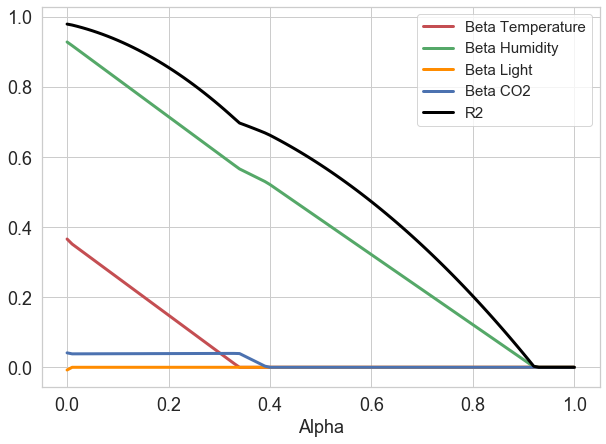

In [9]:
alphas = [x/100 for x in range(0, 101)]

b1 = []
b2 = []
b3 = []
b4 = []
R2s = []

for a in alphas:
    reg = Lasso(alpha = a)
    reg.fit(df_tr_norm[[x for x in df_tr_norm.columns if x != 'HumidityRatio']].values, df_tr_norm[y])
    #print('Coefficients: \n', reg.coef_)
    #print('Intercept: \n', reg.intercept_)
    #print()
    y_pred = reg.predict(df_te_norm[[x for x in df_tr_norm.columns if x != 'HumidityRatio']].values)
    #print('R2: %.3f' % r2_score(df_te_norm[y], y_pred))
    #print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
    #print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))
    b1.append(reg.coef_[0])
    b2.append(reg.coef_[1])
    b3.append(reg.coef_[2])
    b4.append(reg.coef_[3])
    R2s.append(r2_score(df_te_norm[y], y_pred))

f=18
plt.figure(figsize=(10, 7))
sns.set(style='whitegrid')
plt.plot(alphas, b1,  color='r', lw=3)
plt.plot(alphas, b2,  color='g', lw=3)
plt.plot(alphas, b3,  color='darkorange', lw=3)
plt.plot(alphas, b4,  color='b', lw=3)
plt.plot(alphas, R2s, color = 'black', lw=3)
plt.legend(['Beta Temperature', 'Beta Humidity', 'Beta Light', 'Beta CO2', 'R2'], fontsize=15)
plt.xlabel("Alpha", fontsize=f)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.show()

## Ridge Regression

Multiple Regression model

In [10]:
reg = Ridge()
reg.fit(df_tr_norm[[x for x in df_tr_norm.columns if x != 'HumidityRatio']].values, df_tr_norm[y])
print('Coefficients: \n', reg.coef_)
print('Intercept: \n', reg.intercept_)
print()
y_pred = reg.predict(df_te_norm[[x for x in df_tr_norm.columns if x != 'HumidityRatio']].values)
print('R2: %.3f' % r2_score(df_te_norm[y], y_pred))
print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))

Coefficients: 
 [ 0.36614619  0.92856354 -0.00769939  0.04127549]
Intercept: 
 -4.962470226230214e-16

R2: 0.980
MSE: 0.020
MAE: 0.111


In [11]:
b0 = []
b1 = []
b2 = []
b3 = []
R2s = []

for a in alphas:
    reg = Ridge(alpha = a)
    reg.fit(df_tr_norm[[x for x in df_tr_norm.columns if x != 'HumidityRatio']].values, df_tr_norm[y])
    #print('Coefficients: \n', reg.coef_)
    #print('Intercept: \n', reg.intercept_)
    #print()
    y_pred = reg.predict(df_te_norm[[x for x in df_tr_norm.columns if x != 'HumidityRatio']].values)
    #print('R2: %.3f' % r2_score(df_te_norm[y], y_pred))
    #print('MSE: %.3f' % mean_squared_error(df_te_norm[y], y_pred))
    #print('MAE: %.3f' % mean_absolute_error(df_te_norm[y], y_pred))
    b0.append(reg.coef_[0])
    b1.append(reg.coef_[1])
    b2.append(reg.coef_[2])
    b3.append(reg.coef_[3])
    R2s.append(r2_score(df_te_norm[y], y_pred))

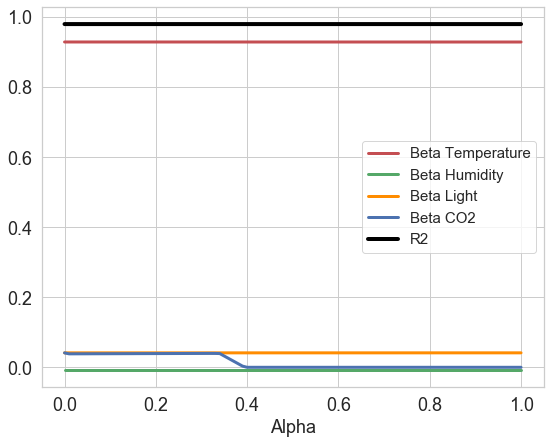

In [12]:
f=18
plt.figure(figsize=(9, 7))
sns.set(style='whitegrid')
plt.plot(alphas, b1,  color='r', lw=3)
plt.plot(alphas, b2,  color='g', lw=3)
plt.plot(alphas, b3,  color='darkorange', lw=3)
plt.plot(alphas, b4,  color='b', lw=3)
plt.plot(alphas, R2s, color = 'black', lw=4)
plt.legend(['Beta Temperature', 'Beta Humidity', 'Beta Light', 'Beta CO2', 'R2'], fontsize=15)
plt.xlabel("Alpha", fontsize=f)
plt.tick_params(axis='both', which='major', labelsize=f)
plt.show()